In [1]:
#import all libraries
from tqdm import tqdm
import os
import time
from random import randint
import numpy as np
from scipy import stats
import pandas as pd

import seaborn as sns
import imageio

from skimage.transform import resize
from skimage.util import montage
from sklearn.model_selection import train_test_split
from sklearn.model_selection import StratifiedKFold
from sklearn.preprocessing import StandardScaler
from sklearn.svm import SVR
from sklearn.model_selection import KFold

import matplotlib.pyplot as plt
from matplotlib import cm
import matplotlib.animation as anim
import matplotlib.patches as mpatches
import matplotlib.gridspec as gridspec

import nilearn as nl
import nibabel as nib
import nilearn.plotting as nlplt

import torch
import torch.nn as nn
from torch.utils.data import Dataset, DataLoader
import torch.nn.functional as F

from torch.optim import Adam
from torch.optim.lr_scheduler import ReduceLROnPlateau
from torch.nn import MSELoss

import albumentations as A
from albumentations import Compose, HorizontalFlip
#from albumentations.pytorch import ToTensor, ToTensorV2 

import nibabel as nib
import h5py

/opt/conda/lib/python3.10/site-packages/albumentations/__init__.py:24: UserWarning: A new version of Albumentations is available: 1.4.22 (you have 1.4.21). Upgrade using: pip install -U albumentations. To disable automatic update checks, set the environment variable NO_ALBUMENTATIONS_UPDATE to 1.
  check_for_updates()


In [2]:
import os
import pandas as pd

train_dir = '/kaggle/input/brats20-dataset-training-validation/BraTS2020_TrainingData/MICCAI_BraTS2020_TrainingData'
val_dir = '/kaggle/input/brats20-dataset-training-validation/BraTS2020_ValidationData/MICCAI_BraTS2020_ValidationData'      

def create_dataframe(data_dir):
    data = []
    for patient_folder in os.listdir(data_dir):
        folder_path = os.path.join(data_dir, patient_folder)
        if os.path.isdir(folder_path):
            patient_id = patient_folder
            data.append({
                'Brats20ID': patient_id,
                'path': folder_path
            })
    return pd.DataFrame(data)

# DataFrames for train and validation sets
train_df = create_dataframe(train_dir)
test_df = create_dataframe(val_dir)

print("Train DataFrame:\n", train_df.head())
print("\nTest DataFrame:\n", test_df.head())

Train DataFrame:
               Brats20ID                                               path
0  BraTS20_Training_083  /kaggle/input/brats20-dataset-training-validat...
1  BraTS20_Training_337  /kaggle/input/brats20-dataset-training-validat...
2  BraTS20_Training_161  /kaggle/input/brats20-dataset-training-validat...
3  BraTS20_Training_198  /kaggle/input/brats20-dataset-training-validat...
4  BraTS20_Training_284  /kaggle/input/brats20-dataset-training-validat...

Test DataFrame:
                 Brats20ID                                               path
0  BraTS20_Validation_084  /kaggle/input/brats20-dataset-training-validat...
1  BraTS20_Validation_118  /kaggle/input/brats20-dataset-training-validat...
2  BraTS20_Validation_111  /kaggle/input/brats20-dataset-training-validat...
3  BraTS20_Validation_060  /kaggle/input/brats20-dataset-training-validat...
4  BraTS20_Validation_034  /kaggle/input/brats20-dataset-training-validat...


In [3]:
class BratsDataset(Dataset):
    def __init__(self, df: pd.DataFrame, phase: str="test", is_resize: bool=False):
        self.df = df
        self.phase = phase
        self.augmentations = get_augmentations(phase)
        self.data_types = ['_flair.nii', '_t1.nii', '_t1ce.nii', '_t2.nii']
        self.is_resize = is_resize
        
    def __len__(self):
        return self.df.shape[0]
    
    def __getitem__(self, idx):
        id_ = self.df.loc[idx, 'Brats20ID']
        root_path = self.df.loc[self.df['Brats20ID'] == id_]['path'].values[0]
        # load all modalities
        images = []
        for data_type in self.data_types:
            img_path = os.path.join(root_path, id_ + data_type)
            img = self.load_img(img_path)#.transpose(2, 0, 1)
            
            if self.is_resize:
                img = self.resize(img)
    
            img = self.normalize(img)
            images.append(img)
        img = np.stack(images)
        img = np.moveaxis(img, (0, 1, 2, 3), (0, 3, 2, 1))
        
        if self.phase != "test":
            mask_path =  os.path.join(root_path, id_ + "_seg.nii")
            mask = self.load_img(mask_path)
            
            if self.is_resize:
                mask = self.resize(mask)
                mask = np.clip(mask.astype(np.uint8), 0, 1).astype(np.float32)
                mask = np.clip(mask, 0, 1)
            mask = self.preprocess_mask_labels(mask)
    
            augmented = self.augmentations(image=img.astype(np.float32), 
                                           mask=mask.astype(np.float32))
            
            img = augmented['image']
            mask = augmented['mask']
        
            return {
                "Id": id_,
                "image": img,
                "mask": mask,
            }
        
        return {
            "Id": id_,
            "image": img,
        }
    
    def load_img(self, file_path):
        data = nib.load(file_path)
        data = np.asarray(data.dataobj)
        return data
    
    def normalize(self, data: np.ndarray):
        data_min = np.min(data)
        return (data - data_min) / (np.max(data) - data_min)
    
    def resize(self, data: np.ndarray):
        data = resize(data, (78, 120, 120), preserve_range=True)
        return data
    
    def preprocess_mask_labels(self, mask: np.ndarray):

        mask_WT = mask.copy()
        mask_WT[mask_WT == 1] = 1
        mask_WT[mask_WT == 2] = 1
        mask_WT[mask_WT == 4] = 1

        mask_TC = mask.copy()
        mask_TC[mask_TC == 1] = 1
        mask_TC[mask_TC == 2] = 0
        mask_TC[mask_TC == 4] = 1

        mask_ET = mask.copy()
        mask_ET[mask_ET == 1] = 0
        mask_ET[mask_ET == 2] = 0
        mask_ET[mask_ET == 4] = 1

        mask = np.stack([mask_WT, mask_TC, mask_ET])
        mask = np.moveaxis(mask, (0, 1, 2, 3), (0, 3, 2, 1))

        return mask

In [4]:
# Losses and Metrics 
def dice_coef_metric(probabilities, truth, threshold=0.5, eps=1e-7):
    """
    Calculate the Dice coefficient for given probabilities and truth masks.
    
    Args:
        probabilities (torch.Tensor): Predicted probabilities.
        truth (torch.Tensor): Ground truth masks.
        threshold (float): Threshold to binarize the predictions.
        eps (float): Small epsilon for numerical stability.
        
    Returns:
        float: Dice coefficient.
    """
    probabilities = (probabilities > threshold).float()
    intersection = (probabilities * truth).sum(dim=(1, 2, 3, 4))
    union = probabilities.sum(dim=(1, 2, 3, 4)) + truth.sum(dim=(1, 2, 3, 4))
    dice = (2.0 * intersection + eps) / (union + eps)
    return dice.cpu().numpy().mean()

def jaccard_coef_metric(probabilities: torch.Tensor,
                        truth: torch.Tensor,
                        threshold: float = 0.5,
                        eps: float = 1e-9) -> float:
    """
    Calculate Jaccard index for a batch of data.
    Args:
        probabilities: Model output probabilities.
        truth: Ground truth masks.
        threshold: Threshold for binarizing predictions.
        eps: Small epsilon to avoid division by zero.
    Returns:
        float: Mean Jaccard index (IoU) for the batch.
    """
    scores = []
    num = probabilities.shape[0]
    predictions = (probabilities >= threshold).float()
    assert predictions.shape == truth.shape, "Shape mismatch between predictions and truth"

    for i in range(num):
        prediction = predictions[i]
        truth_ = truth[i]
        intersection = (prediction * truth_).sum()
        union = (prediction.sum() + truth_.sum()) - intersection + eps
        if truth_.sum() == 0 and prediction.sum() == 0:
            scores.append(1.0)
        else:
            scores.append((intersection + eps) / union)

    # Move tensor to CPU and convert to NumPy
    scores = [score.cpu().item() if isinstance(score, torch.Tensor) else score for score in scores]
    return np.mean(scores)


class Meter:
    '''factory for storing and updating iou and dice scores.'''
    def __init__(self, treshold: float = 0.3):
        self.threshold: float = treshold
        self.dice_scores: list = []
        self.iou_scores: list = []
    
    def update(self, logits: torch.Tensor, targets: torch.Tensor):
        """
        Takes: logits from output model and targets,
        calculates dice and iou scores, and stores them in lists.
        """
        probs = torch.sigmoid(logits)
        dice = dice_coef_metric(probs, targets, self.threshold)
        iou = jaccard_coef_metric(probs, targets, self.threshold)
        
        self.dice_scores.append(dice)
        self.iou_scores.append(iou)
    
    def get_metrics(self) -> np.ndarray:
        """
        Returns: the average of the accumulated dice and iou scores.
        """
        dice = np.mean(self.dice_scores)
        iou = np.mean(self.iou_scores)
        return dice, iou


class DiceLoss(nn.Module):
    """Calculate dice loss."""
    def __init__(self, eps: float = 1e-9):
        super(DiceLoss, self).__init__()
        self.eps = eps
        
    def forward(self,
                logits: torch.Tensor,
                targets: torch.Tensor) -> torch.Tensor:
        
        num = targets.size(0)
        probability = torch.sigmoid(logits)
        probability = probability.view(num, -1)
        targets = targets.view(num, -1)
        assert(probability.shape == targets.shape)
        
        intersection = 2.0 * (probability * targets).sum()
        union = probability.sum() + targets.sum()
        dice_score = (intersection + self.eps) / union
        #print("intersection", intersection, union, dice_score)
        return 1.0 - dice_score
        
        
class BCEDiceLoss(nn.Module):
    """Compute objective loss: BCE loss + DICE loss."""
    def __init__(self):
        super(BCEDiceLoss, self).__init__()
        self.bce = nn.BCEWithLogitsLoss()
        self.dice = DiceLoss()
        
    def forward(self, 
                logits: torch.Tensor,
                targets: torch.Tensor) -> torch.Tensor:
        assert(logits.shape == targets.shape)
        dice_loss = self.dice(logits, targets)
        bce_loss = self.bce(logits, targets)
        
        return bce_loss + dice_loss
    

In [ ]:
# 3D UNet Model
class DoubleConv(nn.Module):
    """(Conv3D -> BN -> ReLU) * 2"""
    def __init__(self, in_channels, out_channels, num_groups=8):
        super().__init__()
        self.double_conv = nn.Sequential(
            nn.Conv3d(in_channels, out_channels, kernel_size=3, stride=1, padding=1),
            #nn.BatchNorm3d(out_channels),
            nn.GroupNorm(num_groups=num_groups, num_channels=out_channels),
            nn.ReLU(inplace=True),

            nn.Conv3d(out_channels, out_channels, kernel_size=3, stride=1, padding=1),
            #nn.BatchNorm3d(out_channels),
            nn.GroupNorm(num_groups=num_groups, num_channels=out_channels),
            nn.ReLU(inplace=True)
          )

    def forward(self,x):
        return self.double_conv(x)

    
class Down(nn.Module):

    def __init__(self, in_channels, out_channels):
        super().__init__()
        self.encoder = nn.Sequential(
            nn.MaxPool3d(2, 2),
            DoubleConv(in_channels, out_channels)
        )
    def forward(self, x):
        return self.encoder(x)

    
class Up(nn.Module):

    def __init__(self, in_channels, out_channels, trilinear=True):
        super().__init__()
        
        if trilinear:
            self.up = nn.Upsample(scale_factor=2, mode='trilinear', align_corners=True)
        else:
            self.up = nn.ConvTranspose3d(in_channels // 2, in_channels // 2, kernel_size=2, stride=2)
            
        self.conv = DoubleConv(in_channels, out_channels)

    def forward(self, x1, x2):
        x1 = self.up(x1)

        diffZ = x2.size()[2] - x1.size()[2]
        diffY = x2.size()[3] - x1.size()[3]
        diffX = x2.size()[4] - x1.size()[4]
        x1 = F.pad(x1, [diffX // 2, diffX - diffX // 2, diffY // 2, diffY - diffY // 2, diffZ // 2, diffZ - diffZ // 2])

        x = torch.cat([x2, x1], dim=1)
        return self.conv(x)

    
class Out(nn.Module):
    def __init__(self, in_channels, out_channels):
        super().__init__()
        self.conv = nn.Conv3d(in_channels, out_channels, kernel_size = 1)

    def forward(self, x):
        return self.conv(x)


class UNet3d(nn.Module):
    def __init__(self, in_channels, n_classes, n_channels):
        super().__init__()
        
        self.in_channels = in_channels
        self.n_classes = n_classes
        self.n_channels = n_channels
        
        # Shared encoder
        self.shared_encoder = nn.Sequential(
            DoubleConv(in_channels, n_channels),
            Down(n_channels, 2 * n_channels),
            Down(2 * n_channels, 4 * n_channels),
            Down(4 * n_channels, 8 * n_channels),
            Down(8 * n_channels, 8 * n_channels)
        )
        
        # Personalized decoder
        self.personalized_decoder = nn.Sequential(
            Up(16 * n_channels, 4 * n_channels),
            Up(8 * n_channels, 2 * n_channels),
            Up(4 * n_channels, n_channels),
            Up(2 * n_channels, n_channels),
            Out(n_channels, n_classes)
        )

    def forward(self, x):
        # Shared encoder
        x1 = self.shared_encoder[0](x)
        x2 = self.shared_encoder[1](x1)
        x3 = self.shared_encoder[2](x2)
        x4 = self.shared_encoder[3](x3)
        x5 = self.shared_encoder[4](x4)

        # Personalized decoder
        mask = self.personalized_decoder[0](x5, x4)
        mask = self.personalized_decoder[1](mask, x3)
        mask = self.personalized_decoder[2](mask, x2)
        mask = self.personalized_decoder[3](mask, x1)
        mask = self.personalized_decoder[4](mask)
        
        return mask

In [6]:
def get_augmentations(phase):
    list_transforms = []
    if phase == "train":
        list_transforms.extend([
            # Add augmentations here
        ])
    return Compose(list_transforms, is_check_shapes=False)

def split_dataframe(df, val_size=0.2, random_state=42):
    """
    Splits a DataFrame into training and validation sets.

    Args:
        df (pd.DataFrame): The DataFrame to be split.
        val_size (float): Proportion of the data to use for validation (default is 0.2).
        random_state (int): Random seed for reproducibility (default is 42).

    Returns:
        tuple: (train_df, val_df) - Training and validation DataFrames.
    """
    train_df, val_df = train_test_split(df, test_size=val_size, random_state=random_state)
    return train_df.reset_index(drop=True), val_df.reset_index(drop=True)

# For Test
def get_dataloader(
    dataset: torch.utils.data.Dataset,
    phase: str,
    fold: int = 0,
    batch_size: int = 1,
    num_workers: int = 4,
):
    '''Returns: dataloader for the model training'''
    #df = pd.read_csv(path_to_csv)
    
    #train_df = df.loc[df['fold'] != fold].reset_index(drop=True)
    #val_df = df.loc[df['fold'] == fold].reset_index(drop=True)

    df = val_df if phase == "val" else test_df
    dataset = dataset(df, phase)
    dataloader = DataLoader(
        dataset,
        batch_size=batch_size,
        num_workers=num_workers,
        pin_memory=True,
        shuffle=True,   
    )
    return dataloader
    
excluded_patient = "BraTS20_Training_355"

def split_data_for_federated_learning(df, num_clients, excluded_patient="BraTS20_Training_355", distribution=None):
    """
    Splits data among clients, excluding a specific patient, with an option for uneven distribution.

    Args:
        df (pd.DataFrame): The dataset to split.
        num_clients (int): Number of clients.
        excluded_patient (str): Patient ID to exclude from the dataset.
        distribution (list of float): Fractions of data for each client. Should sum to 1.

    Returns:
        List[pd.DataFrame]: A list of DataFrames, one for each client.
    """
    if distribution is None:
        # Default
        distribution = [1 / num_clients] * num_clients
    else:
        assert len(distribution) == num_clients, "Distribution length must match number of clients."
        assert abs(sum(distribution) - 1.0) < 1e-6, "Distribution must sum to 1."

    filtered_df = df[df['Brats20ID'] != excluded_patient].reset_index(drop=True)
    client_dfs = []
    indices = np.arange(len(filtered_df))
    np.random.shuffle(indices)

    start_idx = 0
    for fraction in distribution:
        split_size = int(fraction * len(filtered_df))
        end_idx = start_idx + split_size
        client_dfs.append(filtered_df.iloc[indices[start_idx:end_idx]].reset_index(drop=True))
        start_idx = end_idx

    return client_dfs

def get_federated_dataloaders(df, dataset_class, num_clients, phase, batch_size=1, num_workers=4, distribution=None):
    """
    Creates dataloaders for each client's local data in federated learning with uneven distribution.

    Args:
        df (pd.DataFrame): Full dataset dataframe.
        dataset_class (Dataset): Dataset class to use.
        num_clients (int): Number of clients.
        phase (str): 'train' or 'val'.
        batch_size (int): Batch size for dataloaders.
        num_workers (int): Number of worker threads for dataloaders.
        distribution (list of float): Fractions of data for each client.

    Returns:
        List[DataLoader]: A list of dataloaders, one for each client.
    """
    client_dfs = split_data_for_federated_learning(df, num_clients, distribution=distribution)
    client_dataloaders = []

    for client_df in client_dfs:
        client_dataset = dataset_class(client_df, phase)
        client_dataloader = DataLoader(
            client_dataset,
            batch_size=batch_size,
            num_workers=num_workers,
            pin_memory=True,
            shuffle=True if phase == 'train' else False
        )
        client_dataloaders.append(client_dataloader)

    return client_dataloaders

In [7]:
train_df, val_df = split_dataframe(train_df, val_size=0.2, random_state=42)

test_dataloader = get_dataloader(dataset=BratsDataset, phase = "test", fold=0)
val_dataloader = get_dataloader(dataset=BratsDataset, phase = "val", fold=0)
len(test_dataloader), len(val_dataloader)

(125, 74)

# Non - IID Data

In [8]:
num_clients = 5  
train_dataloaders = get_federated_dataloaders(
    train_df,
    BratsDataset,
    num_clients,
    phase='train',
    batch_size=1, distribution = [0.15, 0.35, 0.25, 0.15, 0.1]
)

# Access each client's dataloader
for client_idx, dataloader in enumerate(train_dataloaders):
    print(f"Client {client_idx} has {len(dataloader)} batches.")

Client 0 has 44 batches.
Client 1 has 102 batches.
Client 2 has 73 batches.
Client 3 has 44 batches.
Client 4 has 29 batches.


In [9]:
import torch
import copy
from collections import OrderedDict

class FederatedTrainerFedPer:
    def __init__(self, model, loss_fn, optimizer_cls, num_clients, device="cuda", lr=1e-4):
        self.model = model
        self.loss_fn = loss_fn
        self.optimizer_cls = optimizer_cls
        self.num_clients = num_clients
        self.device = device
        self.lr = lr

        # Separate shared and personalized parameters
        self.shared_parameters = list(self.model.shared_encoder.parameters())
        self.personalized_parameters = list(self.model.personalized_decoder.parameters())

        # Create client models and optimizers
        self.client_models = [self._create_client_model() for _ in range(num_clients)]
        self.client_optimizers = [
            self.optimizer_cls([
                {"params": client_model.shared_encoder.parameters()},
                {"params": client_model.personalized_decoder.parameters(), "lr": lr}
            ])
            for client_model in self.client_models
        ]

        # Metrics logs
        self.global_metrics = {"train_losses": [], "val_dice_scores": [], "val_iou_scores": []}
        self.client_metrics = [{"train_losses": []} for _ in range(self.num_clients)]

    def _create_client_model(self):
        client_model = UNet3d(self.model.in_channels, self.model.n_classes, self.model.n_channels)
        client_model.load_state_dict(self.model.state_dict())
        return client_model.to(self.device)

    def train(self, client_dataloaders, val_dataloader, num_epochs=10):
        for epoch in range(num_epochs):
            print(f"Epoch {epoch + 1}/{num_epochs}")
            client_losses = []
            for client_id, client_loader in enumerate(client_dataloaders):
                client_loss = self._train_single_client(client_id, client_loader)
                if client_loss is not None:
                    client_losses.append(client_loss)
                    self.client_metrics[client_id]["train_losses"].append(client_loss)
            
            if client_losses:
                avg_loss = sum(client_losses) / len(client_losses)
                print(f"Average Client Loss: {avg_loss:.4f}")
                self.global_metrics["train_losses"].append(avg_loss)
            else:
                print("No valid losses to average.")

            self._aggregate_global_parameters()

            dice, iou = self.validate(val_dataloader)
            self.global_metrics["val_dice_scores"].append(dice)
            self.global_metrics["val_iou_scores"].append(iou)

    def _train_single_client(self, client_id, dataloader):
        client_model = self.client_models[client_id]
        client_optimizer = self.client_optimizers[client_id]
        client_model.train()
        total_loss = 0

        for batch in dataloader:
            inputs = batch["image"].to(self.device)
            targets = batch["mask"].to(self.device)

            client_optimizer.zero_grad()
            outputs = client_model(inputs)
            loss = self.loss_fn(outputs, targets)
            if loss is not None:
                loss.backward()
                client_optimizer.step()
                total_loss += loss.item()

        if len(dataloader) > 0:
            avg_loss = total_loss / len(dataloader)
            return avg_loss
        else:
            return None

    def _aggregate_global_parameters(self):
        shared_state_dict = self.model.shared_encoder.state_dict()
        client_shared_state_dicts = [
            client_model.shared_encoder.state_dict() for client_model in self.client_models
        ]

        aggregated_state_dict = {key: torch.zeros_like(value) for key, value in shared_state_dict.items()}

        for key in shared_state_dict.keys():
            aggregated_state_dict[key] = torch.stack(
                [client_dict[key].detach() for client_dict in client_shared_state_dicts], dim=0
            ).mean(dim=0)

        self.model.shared_encoder.load_state_dict(aggregated_state_dict)

        for client_model in self.client_models:
            client_model.shared_encoder.load_state_dict(aggregated_state_dict)

        print("Global shared encoder parameters aggregated successfully.")

    def validate(self, val_loader):
        temp_model = copy.deepcopy(self.model)
        
        avg_personalized_state_dict = self.model.personalized_decoder.state_dict()
        for key in avg_personalized_state_dict.keys():
            avg_personalized_state_dict[key] = torch.stack(
                [client_model.personalized_decoder.state_dict()[key].detach() 
                 for client_model in self.client_models], dim=0
            ).mean(dim=0)
        
        temp_model.personalized_decoder.load_state_dict(avg_personalized_state_dict)
        temp_model.eval()
        meter = Meter()

        with torch.no_grad():
            for batch in val_loader:
                inputs = batch["image"].to(self.device)
                targets = batch["mask"].to(self.device)

                outputs = temp_model(inputs)
                probs = torch.sigmoid(outputs)
                preds = (probs > 0.5).float()

                meter.update(outputs, targets)

        dice, iou = meter.get_metrics()
        print(f"Validation Dice Score: {dice:.4f}, IoU: {iou:.4f}")
        return dice, iou


In [10]:
unet_model = UNet3d(in_channels=4, n_classes=3, n_channels=16).to("cuda")
loss_function = BCEDiceLoss()

# number of clients
num_clients = 5

federated_trainer = FederatedTrainerFedPer(unet_model, loss_function, Adam, num_clients)
federated_trainer.train(train_dataloaders, val_dataloader, num_epochs=25)

Epoch 1/25
Average Client Loss: 1.6026
Global shared encoder parameters aggregated successfully.
Validation Dice Score: 0.0107, IoU: 0.0054
Epoch 2/25
Average Client Loss: 1.5192
Global shared encoder parameters aggregated successfully.
Validation Dice Score: 0.0105, IoU: 0.0053
Epoch 3/25
Average Client Loss: 1.4865
Global shared encoder parameters aggregated successfully.
Validation Dice Score: 0.0104, IoU: 0.0052
Epoch 4/25
Average Client Loss: 1.4615
Global shared encoder parameters aggregated successfully.
Validation Dice Score: 0.0131, IoU: 0.0066
Epoch 5/25
Average Client Loss: 1.4414
Global shared encoder parameters aggregated successfully.
Validation Dice Score: 0.0136, IoU: 0.0068
Epoch 6/25
Average Client Loss: 1.4242
Global shared encoder parameters aggregated successfully.
Validation Dice Score: 0.0136, IoU: 0.0068
Epoch 7/25
Average Client Loss: 1.4077
Global shared encoder parameters aggregated successfully.
Validation Dice Score: 0.0137, IoU: 0.0069
Epoch 8/25
Average C

In [11]:
import matplotlib.pyplot as plt

def plot_metrics(metrics_log, title="Training and Validation Metrics"):
    """
    Plots training and validation metrics such as losses, Dice scores, and IoU scores.

    Args:
        metrics_log (dict): Dictionary containing metrics to visualize. Expected keys:
            - 'train_losses': List of average training losses for each epoch.
            - 'val_dice_scores': List of Dice scores for validation after each epoch.
            - 'val_iou_scores': List of IoU scores for validation after each epoch.
        title (str): Title for the plot.
    """
    epochs = range(1, len(metrics_log["train_losses"]) + 1)

    plt.figure(figsize=(12, 6))

    # Plot Training Loss
    plt.plot(epochs, metrics_log["train_losses"], label="Training Loss", marker="o")

    # Plot Validation Dice Score
    plt.plot(epochs, metrics_log["val_dice_scores"], label="Validation Dice Score", marker="s")

    # Plot Validation IoU Score
    plt.plot(epochs, metrics_log["val_iou_scores"], label="Validation IoU Score", marker="^")

    plt.title(title)
    plt.xlabel("Epochs")
    plt.ylabel("Metric Value")
    plt.legend()
    plt.grid()
    plt.show()


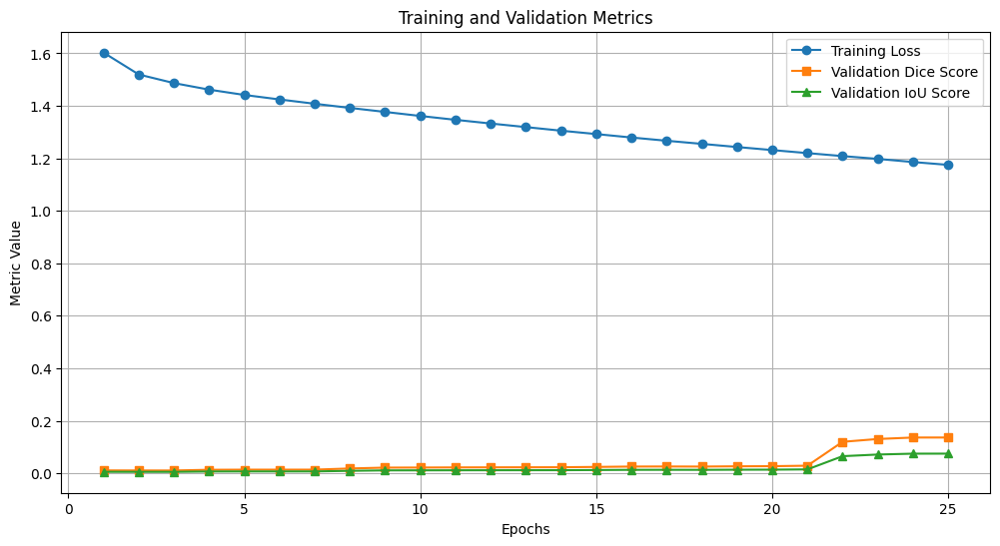

In [13]:
plot_metrics(federated_trainer.global_metrics)

In [65]:
def plot_client_metrics(client_metrics_log, title="Client Training Metrics"):
    """
    Plots training metrics for each client.

    Args:
        client_metrics_log (list): List of client metrics logs, where each element is a dict
                                   with keys like "train_losses".
        title (str): Title for the plot.
    """
    plt.figure(figsize=(12, 8))
    for client_id, metrics in enumerate(client_metrics_log):
        if "train_losses" in metrics:
            epochs = range(1, len(metrics["train_losses"]) + 1)
            plt.plot(epochs, metrics["train_losses"], label=f"Client {client_id} Loss", marker="o")

    plt.title(title)
    plt.xlabel("Epochs")
    plt.ylabel("Loss")
    plt.legend()
    plt.grid(True)
    plt.show()


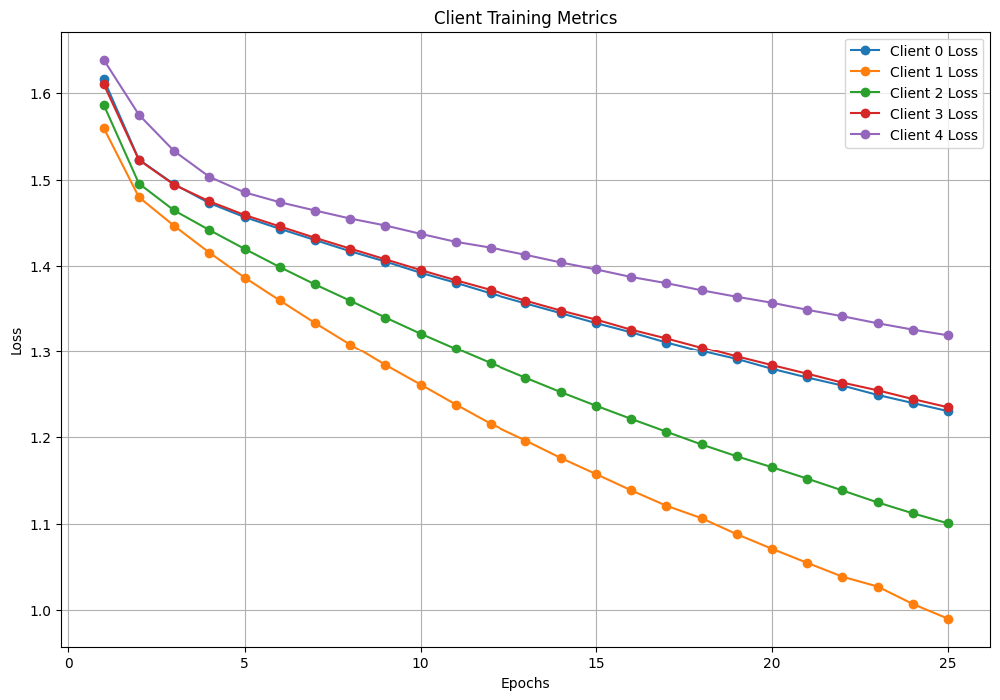

In [66]:
plot_client_metrics(federated_trainer.client_metrics)

In [ ]:
model = federated_trainer.model
model_path = "unet3d_weights.pth"
torch.save(model.state_dict(), model_path)
print(f"Model weights saved to {model_path}")

In [16]:
def validate_single_client(client_model, val_loader, loss_fn, device="cuda"):
    """
    Validate a single client's model using the shared validation loader.

    Args:
        client_model (torch.nn.Module): The personalized model of the client.
        val_loader (DataLoader): The shared validation DataLoader.
        loss_fn (callable): The loss function to calculate the loss during validation.
        device (str): Device to run the validation on ("cuda" or "cpu").

    Returns:
        dict: Dictionary containing Dice score, IoU, and validation loss for the client.
    """
    client_model.eval()
    meter = Meter()  # Assumes you have a Meter class for calculating metrics
    total_loss = 0

    with torch.no_grad():
        for batch in val_loader:
            inputs = batch["image"].to(device)
            targets = batch["mask"].to(device)

            outputs = client_model(inputs)
            loss = loss_fn(outputs, targets)
            total_loss += loss.item()

            # Calculate metrics
            meter.update(outputs, targets)

    dice, iou = meter.get_metrics()
    avg_loss = total_loss / len(val_loader) if len(val_loader) > 0 else 0.0
    print(f"Validation Loss: {avg_loss:.4f}, Dice Score: {dice:.4f}, IoU: {iou:.4f}")

    return {"loss": avg_loss, "dice_score": dice, "iou_score": iou}



def validate_all_clients(client_models, val_loader, loss_fn, device="cuda"):
    """
    Validate all clients using the shared validation loader.

    Args:
        client_models (list): List of personalized models for each client.
        val_loader (DataLoader): The shared validation DataLoader.
        loss_fn (callable): The loss function to calculate the loss during validation.
        device (str): Device to run the validation on ("cuda" or "cpu").

    Returns:
        list: List of dictionaries containing validation metrics for each client.
    """
    client_metrics = []
    for client_id, client_model in enumerate(client_models):
        print(f"Validating Client {client_id}...")
        metrics = validate_single_client(client_model, val_loader, loss_fn, device)
        client_metrics.append(metrics)
    return client_metrics


    
client_metrics = validate_all_clients(
    federated_trainer.client_models,  # List of client models
    val_dataloader,                   # Shared validation DataLoader
    loss_function,                    # Loss function
    device="cuda"                     # Device (e.g., "cuda" or "cpu")
)

# Print metrics for each client
for client_id, metrics in enumerate(client_metrics):
    print(f"Client {client_id} Metrics: {metrics}")


Validating Client 0...
Validation Loss: 1.2332, Dice Score: 0.0300, IoU: 0.0153
Validating Client 1...
Validation Loss: 0.9941, Dice Score: 0.4525, IoU: 0.3072
Validating Client 2...
Validation Loss: 1.1016, Dice Score: 0.4649, IoU: 0.3179
Validating Client 3...
Validation Loss: 1.2351, Dice Score: 0.0313, IoU: 0.0160
Validating Client 4...
Validation Loss: 1.3223, Dice Score: 0.0268, IoU: 0.0137
Client 0 Metrics: {'loss': 1.2331743063153446, 'dice_score': 0.030007102, 'iou_score': 0.015311801545730969}
Client 1 Metrics: {'loss': 0.9941358316589046, 'dice_score': 0.45253944, 'iou_score': 0.3072266892555195}
Client 2 Metrics: {'loss': 1.1016017875155888, 'dice_score': 0.4648711, 'iou_score': 0.317910457967554}
Client 3 Metrics: {'loss': 1.2350910982570134, 'dice_score': 0.031319607, 'iou_score': 0.016015575168264174}
Client 4 Metrics: {'loss': 1.322343152922553, 'dice_score': 0.026833441, 'iou_score': 0.013663251802476274}


In [60]:
class Image3dToGIF3d:
    """
    Displaying 3D images in 3d axes.
    Parameters:
        img_dim: shape of cube for resizing.
        figsize: figure size for plotting in inches.
    """
    def __init__(self, 
                 img_dim: tuple = (55, 55, 55),
                 figsize: tuple = (15, 10),
                 binary: bool = False,
                 normalizing: bool = True,
                ):
        """Initialization."""
        self.img_dim = img_dim
        print(img_dim)
        self.figsize = figsize
        self.binary = binary
        self.normalizing = normalizing

    def _explode(self, data: np.ndarray):
        """
        Takes: array and return an array twice as large in each dimension,
        with an extra space between each voxel.
        """
        shape_arr = np.array(data.shape)
        size = shape_arr[:3] * 2 - 1
        exploded = np.zeros(np.concatenate([size, shape_arr[3:]]),
                            dtype=data.dtype)
        exploded[::2, ::2, ::2] = data
        return exploded

    def _expand_coordinates(self, indices: np.ndarray):
        x, y, z = indices
        x[1::2, :, :] += 1
        y[:, 1::2, :] += 1
        z[:, :, 1::2] += 1
        return x, y, z
    
    def _normalize(self, arr: np.ndarray):
        """Normilize image value between 0 and 1."""
        arr_min = np.min(arr)
        return (arr - arr_min) / (np.max(arr) - arr_min)

    
    def _scale_by(self, arr: np.ndarray, factor: int):
        """
        Scale 3d Image to factor.
        Parameters:
            arr: 3d image for scalling.
            factor: factor for scalling.
        """
        mean = np.mean(arr)
        return (arr - mean) * factor + mean
    
    def get_transformed_data(self, data: np.ndarray):
        """Data transformation: normalization, scaling, resizing."""
        if self.binary:
            resized_data = resize(data, self.img_dim, preserve_range=True)
            return np.clip(resized_data.astype(np.uint8), 0, 1).astype(np.float32)
            
        norm_data = np.clip(self._normalize(data)-0.1, 0, 1) ** 0.4
        scaled_data = np.clip(self._scale_by(norm_data, 2) - 0.1, 0, 1)
        resized_data = resize(scaled_data, self.img_dim, preserve_range=True)
        
        return resized_data
    
    def plot_cube(self,
              cube,
              title: str = '',
              init_angle: int = 0,
              make_gif: bool = False,
              path_to_save: str = 'filename.gif'):
        """
        Plot 3D data.
    
        Parameters:
            cube: 3D data.
            title: Title for the figure.
            init_angle: Angle for the image plot (from 0-360).
            make_gif: If True, create a GIF from every 5th frame of the 3D image plot.
            path_to_save: Path to save the GIF file.
        """
        if self.binary:
            facecolors = cm.winter(cube)
            print("binary")
        else:
            if self.normalizing:
                cube = self._normalize(cube)
            facecolors = cm.gist_stern(cube)
            print("not binary")
    
        facecolors[:, :, :, -1] = cube  # Set alpha transparency
        facecolors = self._explode(facecolors)  # Add spacing for visual clarity
    
        filled = facecolors[:, :, :, -1] != 0
        x, y, z = self._expand_coordinates(np.indices(np.array(filled.shape) + 1))
    
        with plt.style.context("dark_background"):
            fig = plt.figure(figsize=self.figsize)
            ax = fig.add_subplot(111, projection='3d')  # Fix: Use add_subplot with projection='3d'
    
            # Set initial viewing angle and axis limits
            ax.view_init(30, init_angle)
            ax.set_xlim(right=self.img_dim[0] * 2)
            ax.set_ylim(top=self.img_dim[1] * 2)
            ax.set_zlim(top=self.img_dim[2] * 2)
            ax.set_title(title, fontsize=18, y=1.05)
    
            # Plot the voxel data
            ax.voxels(x, y, z, filled, facecolors=facecolors, shade=False)
    
            if make_gif:
                images = []
                for angle in tqdm(range(0, 360, 5)):
                    ax.view_init(30, angle)
                    fname = f"frame_{angle}.png"
    
                    # Save the frame with a consistent DPI and format
                    plt.savefig(fname, dpi=120, format='png', bbox_inches='tight')
    
                    # Load the image and ensure it has a consistent shape
                    img = imageio.v2.imread(fname)
                    if len(images) > 0 and img.shape != images[0].shape:
                        img = np.resize(img, images[0].shape)  # Resize to match previous frames
                    images.append(img)
                    os.remove(fname)  # Clean up temporary files
                imageio.mimsave(path_to_save, images)
                print(f"GIF saved at {path_to_save}")
                plt.close(fig)
            else:
                plt.show()



                
class ShowResult:
  
    def mask_preprocessing(self, mask):
        """
        Preprocesses the mask to ensure it's in the correct format.
        """
        if isinstance(mask, torch.Tensor):
            mask = mask.squeeze().cpu().detach().numpy()  # Process if it's a PyTorch tensor
        else:
            mask = mask.squeeze()  # Just squeeze if it's already a NumPy array
    
        mask = np.moveaxis(mask, (0, 1, 2, 3), (0, 3, 2, 1))
        mask_WT = np.rot90(montage(mask[0]))
        mask_TC = np.rot90(montage(mask[1]))
        mask_ET = np.rot90(montage(mask[2]))
    
        return mask_WT, mask_TC, mask_ET

    def image_preprocessing(self, image):
        """
        Returns image flair as mask for overlaping gt and predictions.
        """
        image = image.squeeze().cpu().detach().numpy()
        image = np.moveaxis(image, (0, 1, 2, 3), (0, 3, 2, 1))
        flair_img = np.rot90(montage(image[0]))
        return flair_img
    
    def plot(self, image, ground_truth, prediction):
        image = self.image_preprocessing(image)
        gt_mask_WT, gt_mask_TC, gt_mask_ET = self.mask_preprocessing(ground_truth)
        pr_mask_WT, pr_mask_TC, pr_mask_ET = self.mask_preprocessing(prediction)
        
        fig, axes = plt.subplots(1, 2, figsize = (35, 30))
    
        [ax.axis("off") for ax in axes]
        axes[0].set_title("Ground Truth", fontsize=35, weight='bold')
        axes[0].imshow(image, cmap ='bone')
        axes[0].imshow(np.ma.masked_where(gt_mask_WT == False, gt_mask_WT),
                  cmap='cool_r', alpha=0.6)
        axes[0].imshow(np.ma.masked_where(gt_mask_TC == False, gt_mask_TC),
                  cmap='autumn_r', alpha=0.6)
        axes[0].imshow(np.ma.masked_where(gt_mask_ET == False, gt_mask_ET),
                  cmap='autumn', alpha=0.6)

        axes[1].set_title("Prediction", fontsize=35, weight='bold')
        axes[1].imshow(image, cmap ='bone')
        axes[1].imshow(np.ma.masked_where(pr_mask_WT == False, pr_mask_WT),
                  cmap='cool_r', alpha=0.6)
        axes[1].imshow(np.ma.masked_where(pr_mask_TC == False, pr_mask_TC),
                  cmap='autumn_r', alpha=0.6)
        axes[1].imshow(np.ma.masked_where(pr_mask_ET == False, pr_mask_ET),
                  cmap='autumn', alpha=0.6)

        plt.tight_layout()
        
        plt.show()
        
#show_result = ShowResult()
#show_result.plot(data['image'], data['mask'], data['mask'])


import imageio

def merging_two_gif(path1, path2, name_to_save):
    """
    Merge two GIFs by combining their frames.
    
    Args:
        path1 (str): Path to the first GIF.
        path2 (str): Path to the second GIF.
        name_to_save (str): Path to save the resulting merged GIF.
    """
    gif1 = imageio.get_reader(path1)
    gif2 = imageio.get_reader(path2)
    new_gif = imageio.get_writer(name_to_save)

    # Get the maximum number of frames
    max_frames = max(len(gif1), len(gif2))

    for frame_number in range(max_frames):
        try:
            img1 = gif1.get_next_data()
        except EOFError:
            # Use the last frame if we run out of frames in gif1
            img1 = gif1.get_data(len(gif1) - 1)

        try:
            img2 = gif2.get_next_data()
        except EOFError:
            # Use the last frame if we run out of frames in gif2
            img2 = gif2.get_data(len(gif2) - 1)

        # Combine the two images side by side
        combined_frame = combine_frames(img1, img2)
        new_gif.append_data(combined_frame)

    gif1.close()
    gif2.close()
    new_gif.close()
    print(f"Merged GIF saved as {name_to_save}")


def combine_frames(img1, img2):
    """
    Combine two frames side by side.

    Args:
        img1 (ndarray): Frame from the first GIF.
        img2 (ndarray): Frame from the second GIF.

    Returns:
        ndarray: Combined frame.
    """
    # Ensure both frames are RGB (drop alpha channel if present)
    if img1.shape[-1] == 4:
        img1 = img1[..., :3]
    if img2.shape[-1] == 4:
        img2 = img2[..., :3]

    # Ensure both frames have the same height
    height = max(img1.shape[0], img2.shape[0])
    width1 = img1.shape[1]
    width2 = img2.shape[1]

    # Create a blank canvas
    combined_frame = np.zeros((height, width1 + width2, 3), dtype=np.uint8)

    # Place both images side by side
    combined_frame[:img1.shape[0], :width1, :] = img1
    combined_frame[:img2.shape[0], width1:width1 + width2, :] = img2

    return combined_frame


def get_all_csv_file(root: str) -> list:
    """Extraction all unique ids from file names."""
    ids = []
    for dirname, _, filenames in os.walk(root):
        for filename in filenames:
            path = os.path.join(dirname, filename)
            if path.endswith(".csv"):
                ids.append(path) 
    ids = list(set(filter(None, ids)))
    print(f"Extracted {len(ids)} csv files.")
    return ids

#csv_paths = get_all_csv_file("../input/brats20-dataset-training-validation/BraTS2020_TrainingData")

In [50]:
def compute_results(model,
                    dataloader,
                    treshold=0.33):

    device = 'cuda' if torch.cuda.is_available() else 'cpu'
    results = {"Id": [],"image": [], "GT": [],"Prediction": []}

    with torch.no_grad():
        for i, data in enumerate(dataloader):
            id_, imgs, targets = data['Id'], data['image'], data['mask']
            imgs, targets = imgs.to(device), targets.to(device)
            logits = model(imgs)
            probs = torch.sigmoid(logits)
            
            predictions = (probs >= treshold).float()
            predictions =  predictions.cpu()
            targets = targets.cpu()
            
            results["Id"].append(id_)
            results["image"].append(imgs.cpu())
            results["GT"].append(targets)
            results["Prediction"].append(predictions)
            
            # only 5 pars
            if (i > 5):    
                return results
        return results

In [51]:
results = compute_results(
    federated_trainer.client_models[0], val_dataloader, 0.33)

In [52]:
for id_, img, gt, prediction in zip(results['Id'][4:],
                    results['image'][4:],
                    results['GT'][4:],
                    results['Prediction'][4:]
                    ):
    
    print(id_)
    break

['BraTS20_Training_241']


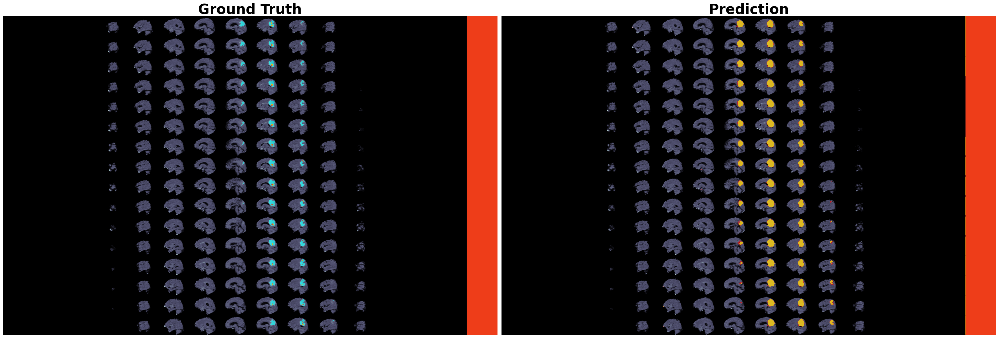

In [38]:
show_result = ShowResult()
show_result.plot(img, gt, prediction)

In [53]:
gt = gt.squeeze().cpu().detach().numpy()
gt = np.moveaxis(gt, (0, 1, 2, 3), (0, 3, 2, 1))
wt,tc, et = gt
print(wt.shape, tc.shape, et.shape)
gt = (wt + tc + et)
gt = np.clip(gt, 0, 1)
print(gt.shape)

(240, 240, 155) (240, 240, 155) (240, 240, 155)
(240, 240, 155)


In [54]:
title = "Ground Truth_" + id_[0]
filename1 = title + "_3d.gif"

data_to_3dgif = Image3dToGIF3d(img_dim = (120, 120, 78), binary=True, normalizing=False)
transformed_data = data_to_3dgif.get_transformed_data(gt)
data_to_3dgif.plot_cube(
    transformed_data,
    title=title,
    make_gif=True,
    path_to_save=filename1
)

(120, 120, 78)
binary


100%|██████████| 72/72 [20:58<00:00, 17.48s/it]


GIF saved at Ground Truth_BraTS20_Training_241_3d.gif


In [55]:
prediction = prediction.squeeze().cpu().detach().numpy()
prediction = np.moveaxis(prediction, (0, 1, 2, 3), (0, 3, 2, 1))
wt,tc,et = prediction
print(wt.shape, tc.shape, et.shape)
prediction = (wt + tc + et)
prediction = np.clip(prediction, 0, 1)
print(prediction.shape)

(240, 240, 155) (240, 240, 155) (240, 240, 155)
(240, 240, 155)


In [56]:
title = "Prediction_" + id_[0]
filename2 = title + "_3d.gif"

data_to_3dgif = Image3dToGIF3d(img_dim = (120, 120, 78), binary=True, normalizing=False)
transformed_data = data_to_3dgif.get_transformed_data(prediction)
data_to_3dgif.plot_cube(
    transformed_data,
    title=title,
    make_gif=True,
    path_to_save=filename2
)

(120, 120, 78)
binary


100%|██████████| 72/72 [31:35<00:00, 26.33s/it]


GIF saved at Prediction_BraTS20_Training_241_3d.gif


Merged GIF saved as result.gif


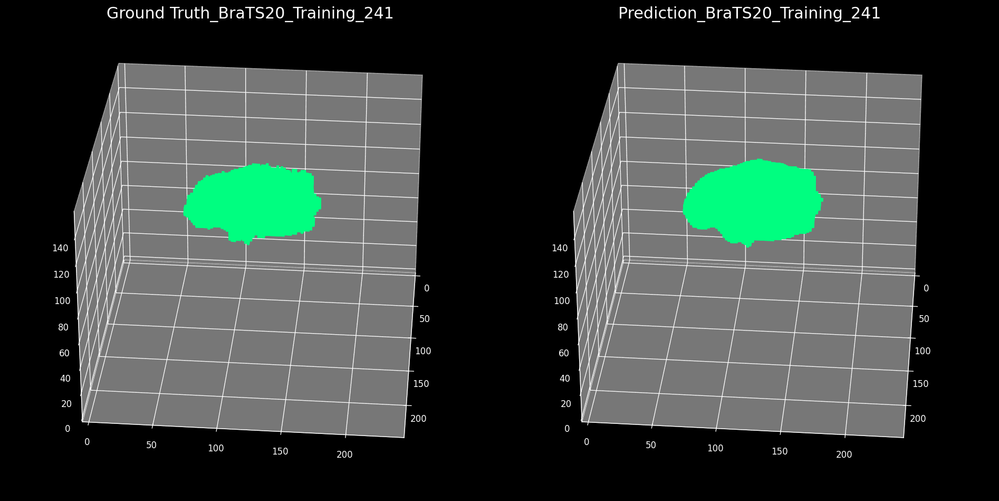

In [62]:
from IPython.display import Image as show_gif
merging_two_gif(filename1,
                filename2, 
                'result.gif')
show_gif('result.gif', format='png')